In [1]:
import geopandas as gpd
import rioxarray as rxr
import xarray as xr         #for reshaping purpose
import pandas as pd
import pytz
import rasterio
import os
import datetime
import numpy as np
import matplotlib.pyplot as plt

from shapely.geometry import Point


os.chdir('/Users/gaurav/UAH/temperature_modelling/')

#Custom modules
from lib import helper
from lib import satellite

%load_ext autoreload
%autoreload 2

In [2]:
def get_file_segments(raster_directory):
    '''Helper Function to  group files by hours'''
    filenames = []
    times = []
    segments = dict()

    for x in os.listdir(raster_directory):
        if '.tif' in x:
            filenames.append(x)
            print(x)
            times.append(satellite.filename_to_date(str(x)))
    
    # for hour in time_dframe.hour.unique():
    #     segments[hour] = []

    time_dframe = pd.DataFrame({'filename':filenames,'time':times})
    time_dframe['time'] = pd.to_datetime(time_dframe['time'])
    time_dframe['hour'] = time_dframe['time'].dt.hour
    file_list = []
    for hour in time_dframe.hour.unique():
        df_ = time_dframe[time_dframe['hour']==hour]
        files = df_.filename.values

        segments[hour] = files

    
    return segments


### Step 1 : Module to convert all tiff files to same size and projection


In [3]:
default_location,default_year,shp_file = helper.get_configs()
print(default_location,default_year)

raster_path_ = f'/Users/gaurav/UAH/ECOSTRESS_and_urban_surface_dataset/{default_location}/ECOSTRESS/geotiff_clipped_stateplane/'
# 
temperature_data_1 = helper.uniform_files(raster_path_)
# df = helper.get_list_of_stations(temperature_data_1)


Madison 2023


In [4]:
#this part aggregates hourly files and save it to output directory
os.chdir(f'/Users/gaurav/UAH/ECOSTRESS_and_urban_surface_dataset/{default_location}/ECOSTRESS/geotiff_clipped_stateplane/')
# Directory containing your raster files
raster_directory = f'/Users/gaurav/UAH/ECOSTRESS_and_urban_surface_dataset/{default_location}/ECOSTRESS/geotiff_clipped_stateplane/'
output_directory = f'/Users/gaurav/UAH/ECOSTRESS_and_urban_surface_dataset/{default_location}/ECOSTRESS/output_directory'
shapefile_path = f'/Users/gaurav/UAH/ECOSTRESS_and_urban_surface_dataset/{default_location}/shpfile/'

if not os.path.exists(output_directory):
    os.makedirs(output_directory)
input_path = os.listdir(raster_directory)[1]

#getting groups of files
segments = get_file_segments(raster_directory)
segments = dict(sorted(segments.items(), key=lambda x: x[0]))

boundary_gdf = gpd.read_file(shapefile_path)
target_crs = gpd.read_file(shapefile_path).crs



for key in segments.keys():
    # print(key)
    value = segments[key]
    path_name = sorted(value)
    temperature_data = rxr.open_rasterio(path_name[0])

    #Its summer data, 0 values were filled with 0
    temperature_data.values[temperature_data.values==0] = np.nan
    value_array = [temperature_data.values]

    if len(path_name)>0:
        for file in path_name[1:]:
            temp_data = rxr.open_rasterio(file).values
            temp_data[temp_data==0] = np.nan
            value_array.append(temp_data)
            
    temperature_data.values = np.nanmean(value_array,axis=0)
    # temperature_data = temperature_data.rio.reproject(target_crs)

    #saving the file to output directory        
    temperature_data.rio.to_raster(f'{output_directory}/temperature_{str(key).zfill(2)}.tif')

print(f'Saved all tiff files to {output_directory}')

ECO2LSTE.001_SDS_LST_doy2021164210808_aid0001_clipped_stateplane.tif
ECO2LSTE.001_SDS_LST_doy2020207052254_aid0001_clipped_stateplane.tif
ECO2LSTE.001_SDS_LST_doy2020160233008_aid0001_clipped_stateplane.tif
ECO2LSTE.001_SDS_LST_doy2020193051349_aid0001_clipped_stateplane.tif
ECO2LSTE.001_SDS_LST_doy2022210024453_aid0001_clipped_stateplane.tif
ECO2LSTE.001_SDS_LST_doy2021198022246_aid0001_clipped_stateplane.tif
ECO2LSTE.001_SDS_LST_doy2021262010539_aid0001_clipped_stateplane.tif
ECO2LSTE.001_SDS_LST_doy2021149213945_aid0001_clipped_stateplane.tif
ECO2LSTE.001_SDS_LST_doy2022243134459_aid0001_clipped_stateplane.tif
ECO2LSTE.001_SDS_LST_doy2022200010735_aid0001_clipped_stateplane.tif
ECO2LSTE.001_SDS_LST_doy2022168135650_aid0001_clipped_stateplane.tif
ECO2LSTE.001_SDS_LST_doy2020195100744_aid0001_clipped_stateplane.tif
ECO2LSTE.001_SDS_LST_doy2019241103621_aid0001_clipped_stateplane.tif
ECO2LSTE.001_SDS_LST_doy2020224163918_aid0001_clipped_stateplane.tif
ECO2LSTE.001_SDS_LST_doy2018252124

/var/folders/qr/fds_zg7j76g51mq0zmqdqfnc0000gn/T/ipykernel_86576/1364984974.py:37: RuntimeWarning: Mean of empty slice
  temperature_data.values = np.nanmean(value_array,axis=0)
/var/folders/qr/fds_zg7j76g51mq0zmqdqfnc0000gn/T/ipykernel_86576/1364984974.py:37: RuntimeWarning: Mean of empty slice
  temperature_data.values = np.nanmean(value_array,axis=0)
/var/folders/qr/fds_zg7j76g51mq0zmqdqfnc0000gn/T/ipykernel_86576/1364984974.py:37: RuntimeWarning: Mean of empty slice
  temperature_data.values = np.nanmean(value_array,axis=0)
/var/folders/qr/fds_zg7j76g51mq0zmqdqfnc0000gn/T/ipykernel_86576/1364984974.py:37: RuntimeWarning: Mean of empty slice
  temperature_data.values = np.nanmean(value_array,axis=0)
/var/folders/qr/fds_zg7j76g51mq0zmqdqfnc0000gn/T/ipykernel_86576/1364984974.py:37: RuntimeWarning: Mean of empty slice
  temperature_data.values = np.nanmean(value_array,axis=0)
/var/folders/qr/fds_zg7j76g51mq0zmqdqfnc0000gn/T/ipykernel_86576/1364984974.py:37: RuntimeWarning: Mean of emp

Saved all tiff files to /Users/gaurav/UAH/ECOSTRESS_and_urban_surface_dataset/Madison/ECOSTRESS/output_directory


/var/folders/qr/fds_zg7j76g51mq0zmqdqfnc0000gn/T/ipykernel_86576/1364984974.py:37: RuntimeWarning: Mean of empty slice
  temperature_data.values = np.nanmean(value_array,axis=0)
/var/folders/qr/fds_zg7j76g51mq0zmqdqfnc0000gn/T/ipykernel_86576/1364984974.py:37: RuntimeWarning: Mean of empty slice
  temperature_data.values = np.nanmean(value_array,axis=0)


/var/folders/qr/fds_zg7j76g51mq0zmqdqfnc0000gn/T/ipykernel_86576/2453530585.py:10: FutureWarning: You are adding a column named 'geometry' to a GeoDataFrame constructed without an active geometry column. Currently, this automatically sets the active geometry column to 'geometry' but in the future that will no longer happen. Instead, either provide geometry to the GeoDataFrame constructor (GeoDataFrame(... geometry=GeoSeries()) or use `set_geometry('geometry')` to explicitly set the active geometry column.
  scatter_data['geometry'] = [Point(xy) for xy in zip(scatter_data['longitude'], scatter_data['latitude'])]


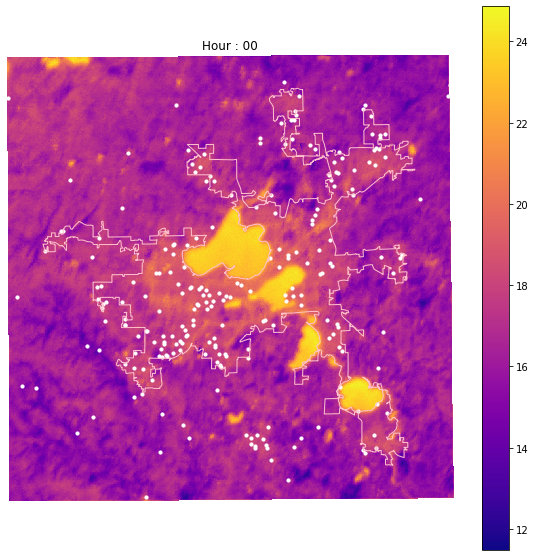

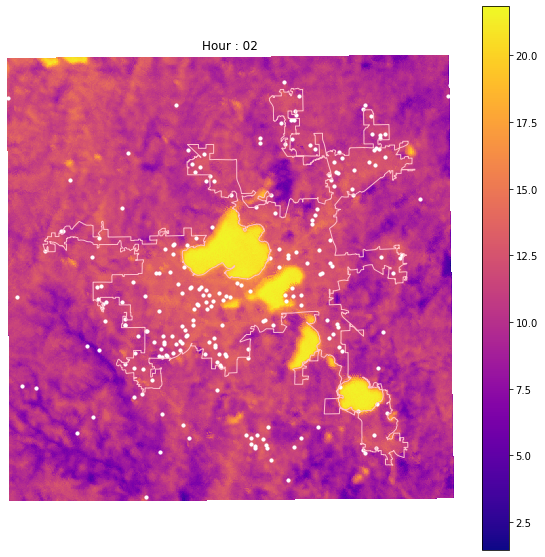

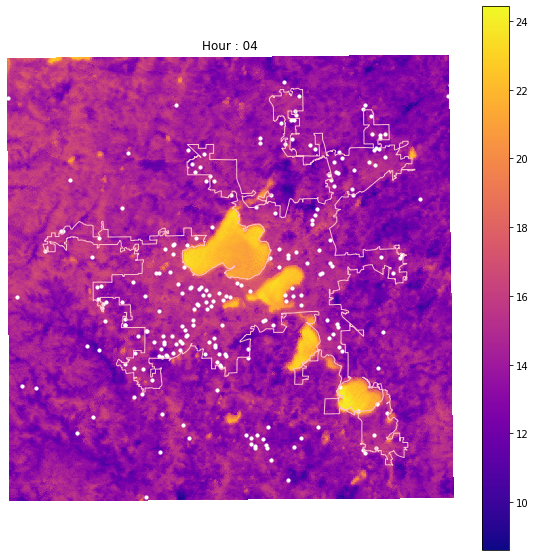

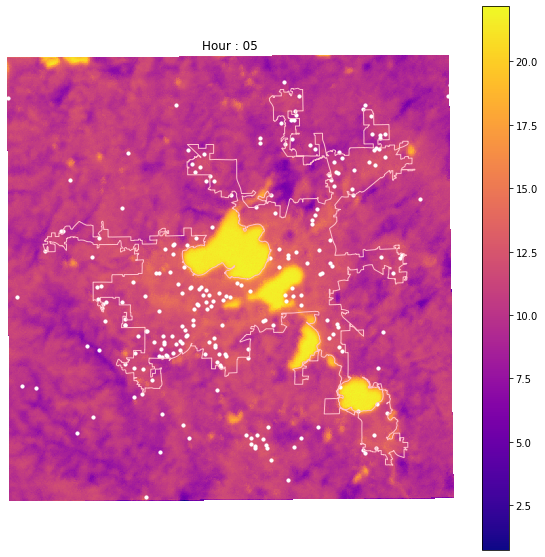

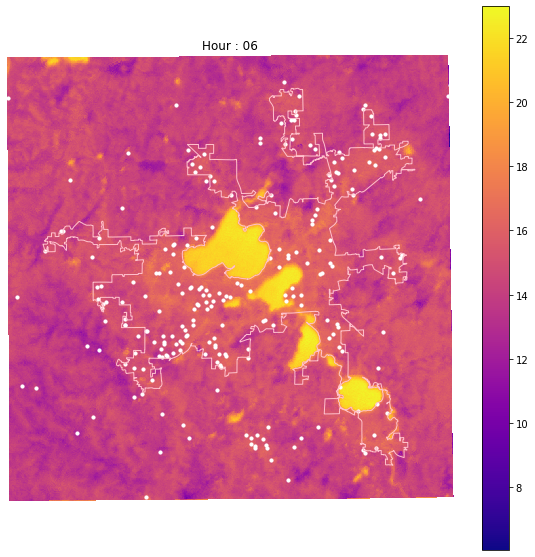

...

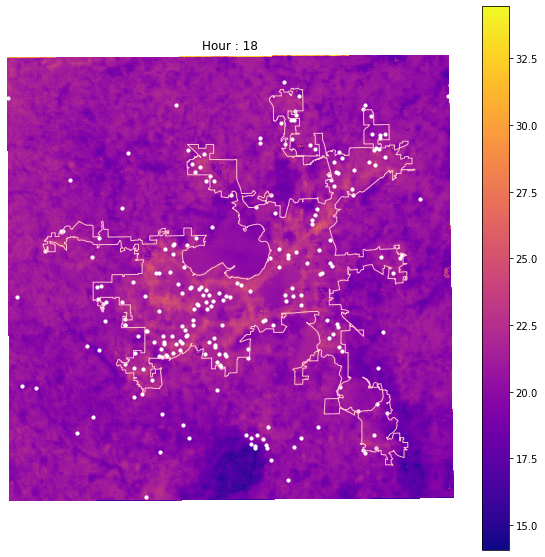

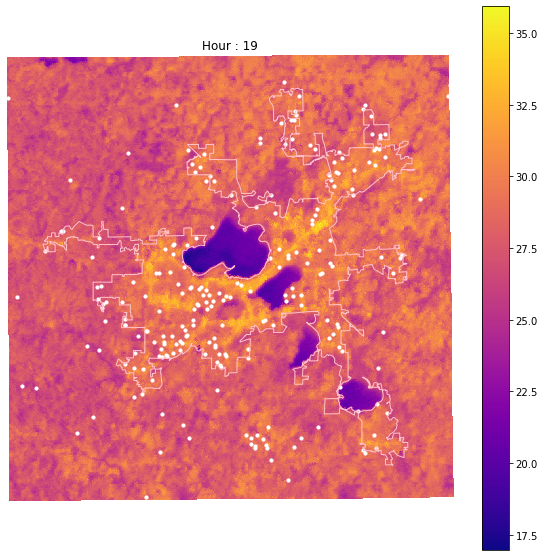

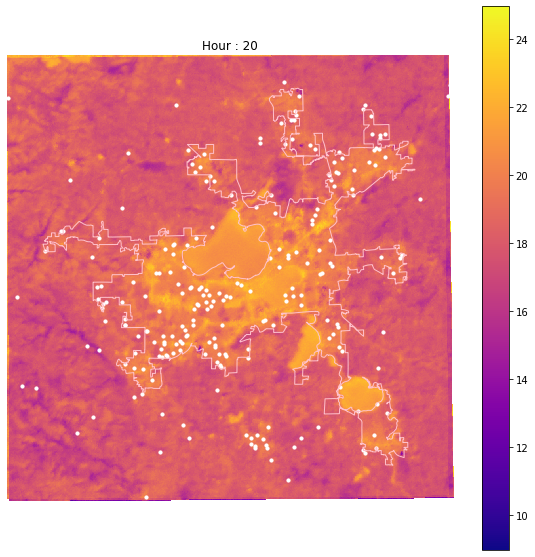

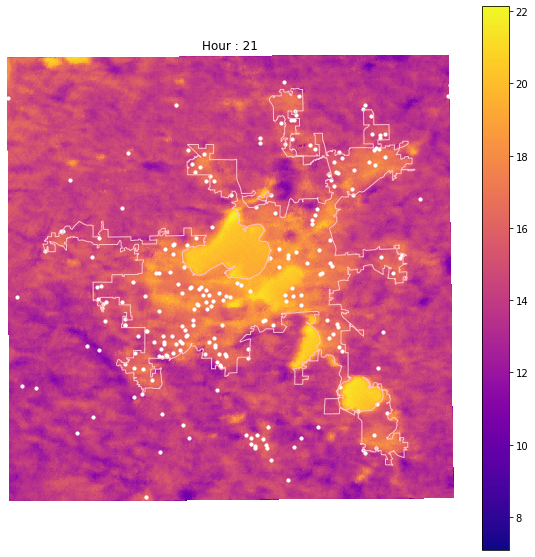

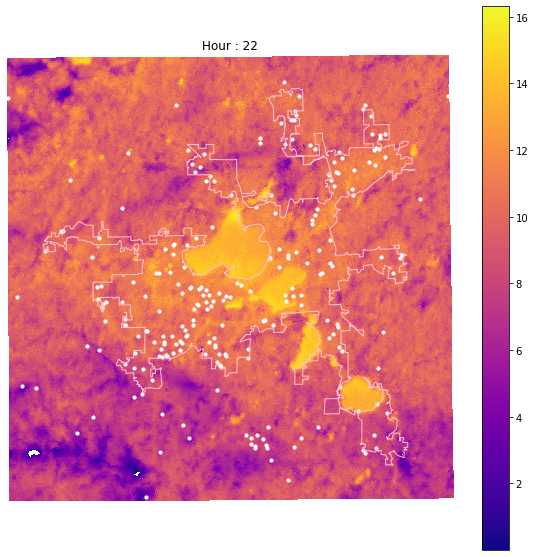

In [5]:
#Creating basic LST Plots to understand LST images

list_of_files = [x for x in sorted(os.listdir(output_directory)) if '.tif' in x]

scatter_data = pd.read_csv(f'/Users/gaurav/UAH/temperature_modelling/data/processed_data/{default_location}_{default_year}/clean_{default_location}_pws_.csv')
scatter_data = scatter_data.groupby(['station','latitude','longitude']).mean().reset_index()[['station','latitude','longitude']]
scatter_data = gpd.GeoDataFrame(scatter_data)
scatter_data['latitude'] = scatter_data['latitude'].astype(float)
scatter_data['longitude'] = scatter_data['longitude'].astype(float)
scatter_data['geometry'] = [Point(xy) for xy in zip(scatter_data['longitude'], scatter_data['latitude'])]
scatter_gdf = gpd.GeoDataFrame(scatter_data,geometry=scatter_data['geometry'], crs="EPSG:4326")

# scatter_gdf = scatter_gdf.to_crs(boundary_gdf.crs)
temperature_data_crs = rxr.open_rasterio(os.path.join(output_directory,list_of_files[0])).rio.crs
scatter_gdf_convert = scatter_gdf.to_crs(temperature_data_crs)
boundary_gdf_convert = boundary_gdf.to_crs(temperature_data_crs)
img_save_path = f'/Users/gaurav/UAH/temperature_modelling/Resources/temperature_plots/{default_location}_{default_year}/'

if not os.path.exists(img_save_path):
    os.makedirs(img_save_path)

for file in list_of_files:
    temp_ = rxr.open_rasterio(os.path.join(output_directory,file))
    plt.figure(figsize=(10,10))
    temp_.plot(cmap='plasma',)    
    # # # boundary_gdf.boundary.plot(ax=plt.gca(), edgecolor='blue', linewidth=1)
    boundary_gdf.to_crs(temperature_data_crs).boundary.plot(ax=plt.gca(), edgecolor='pink', linewidth=1)
    scatter_gdf_convert.plot(ax=plt.gca(), color='white', markersize=10)
    plt.axis('off')  # Hide axis

    if 'interploated' not in file:
        fname = str(file.split('_')[1].split('.')[0]).zfill(2)  #gives hour
        title = f'Hour : {fname}'
    else:
        fname = str(file.split('_')[2].split('.')[0]).zfill(2)
        title = f'Hour : {fname} (Interploated)'
    
    save_loc = f'/Users/gaurav/UAH/temperature_modelling/Resources/temperature_plots/{default_location}_{default_year}/hour_{fname}.png'
    
    
    plt.title(title)
    # plt.savefig(save_loc, bbox_inches='tight', pad_inches=0, dpi=300,)



In [6]:
##locations to save aggregated and interpolated LST images
updated_raster_directory = f'/Users/gaurav/UAH/ECOSTRESS_and_urban_surface_dataset/{default_location}/ECOSTRESS/output_directory/'
adjusted_lst_directory = f'/Users/gaurav/UAH/ECOSTRESS_and_urban_surface_dataset/{default_location}/ECOSTRESS/adjusted_output_directory/'
adjusted_save_directory = f'/Users/gaurav/UAH/temperature_modelling/Resources/temperature_plots/{default_location}_2021_adjusted_lst/'

# elevation_file = f'/Users/gaurav/UAH/ECOSTRESS_and_urban_surface_dataset/{default_location}/urban_surface_data/USGS_DEM_resampled_eco.tif'


if not os.path.exists(adjusted_lst_directory):
    os.makedirs(adjusted_lst_directory,exist_ok=True)

if not os.path.exists(adjusted_save_directory):
    os.makedirs(adjusted_save_directory,exist_ok=True)
    
files = sorted([x for x in os.listdir(updated_raster_directory) if '.tif' in x])
files = [x for x in files if 'interploated' not in x]

for file in files:
    
    temp_ = rxr.open_rasterio(os.path.join(updated_raster_directory,file))
    temp_.values = temp_.values - np.nanmean(temp_.values) + min(temp_.values)
    # temp_.values = temp_.values - np.nanmean(temp_.values)
    temp_.rio.to_raster(f'{adjusted_lst_directory}/{file}')

# urban_file = rxr.open_rasterio(elevation_file)
# urban_file.values = urban_file.values - np.nanmean(urban_file.values)
# urban_file.rio.to_raster(f'{adjusted_lst_directory}/USGS_DEM_resampled_eco_adjusted.tif')

In [18]:
## Interpolating missing hours for adjusted LST

#adjusted_lst_directory  : comes from above

files = [x for x in sorted(os.listdir(adjusted_lst_directory)) if '.tif' in x]
hours = [int(x.split('_')[1].split('.')[0]) for x in files if 'interpolated' not in x]

missing_hours = [x for x in range(0,24) if x not in hours]

#for now, filling missing hours with average of before and after hour

for hour in missing_hours:
    if hour == 0:
        before_hour = 23 if 23 in hours else 22
        after_hour = 1 if 1 in hours else 0
    elif hour == 23:
        before_hour = 22 if 22 in hours else 21
        after_hour = 0 if 0 in hours else 1

    else:
        before_hour = hour-1
        after_hour = hour+1
    
    before_hour_file = [x for x in files if str(before_hour).zfill(2) in x][0]
    after_hour_file = [x for x in files if str(after_hour).zfill(2) in x][0]

    print(f'hour : {hour}, before_hour : {before_hour_file}, after_hour : {after_hour_file}')

    before_hour_data = rxr.open_rasterio(os.path.join(adjusted_lst_directory,before_hour_file))
    after_hour_data = rxr.open_rasterio(os.path.join(adjusted_lst_directory,after_hour_file))

    missing_hour_data = np.nanmean([before_hour_data.values,after_hour_data.values],axis=0)
    before_hour_data.values = missing_hour_data

    before_hour_data.rio.to_raster(f'{adjusted_lst_directory}/interpolated_temperature_{str(hour).zfill(2)}.tif')
    print(f'File created : interpolated_temperature_{str(hour).zfill(2)}.tif')

hour : 1, before_hour : temperature_00.tif, after_hour : temperature_02.tif
File created : interpolated_temperature_01.tif
hour : 3, before_hour : temperature_02.tif, after_hour : temperature_04.tif
File created : interpolated_temperature_03.tif
hour : 13, before_hour : temperature_12.tif, after_hour : temperature_14.tif
File created : interpolated_temperature_13.tif
hour : 17, before_hour : temperature_16.tif, after_hour : temperature_18.tif
File created : interpolated_temperature_17.tif
hour : 23, before_hour : temperature_22.tif, after_hour : temperature_00.tif
File created : interpolated_temperature_23.tif


/var/folders/qr/fds_zg7j76g51mq0zmqdqfnc0000gn/T/ipykernel_86576/691738468.py:32: RuntimeWarning: Mean of empty slice
  missing_hour_data = np.nanmean([before_hour_data.values,after_hour_data.values],axis=0)
/var/folders/qr/fds_zg7j76g51mq0zmqdqfnc0000gn/T/ipykernel_86576/691738468.py:32: RuntimeWarning: Mean of empty slice
  missing_hour_data = np.nanmean([before_hour_data.values,after_hour_data.values],axis=0)
/var/folders/qr/fds_zg7j76g51mq0zmqdqfnc0000gn/T/ipykernel_86576/691738468.py:32: RuntimeWarning: Mean of empty slice
  missing_hour_data = np.nanmean([before_hour_data.values,after_hour_data.values],axis=0)
/var/folders/qr/fds_zg7j76g51mq0zmqdqfnc0000gn/T/ipykernel_86576/691738468.py:32: RuntimeWarning: Mean of empty slice
  missing_hour_data = np.nanmean([before_hour_data.values,after_hour_data.values],axis=0)
/var/folders/qr/fds_zg7j76g51mq0zmqdqfnc0000gn/T/ipykernel_86576/691738468.py:32: RuntimeWarning: Mean of empty slice
  missing_hour_data = np.nanmean([before_hour_data

/var/folders/qr/fds_zg7j76g51mq0zmqdqfnc0000gn/T/ipykernel_86576/49489940.py:16: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  plt.figure(figsize=(10,10))


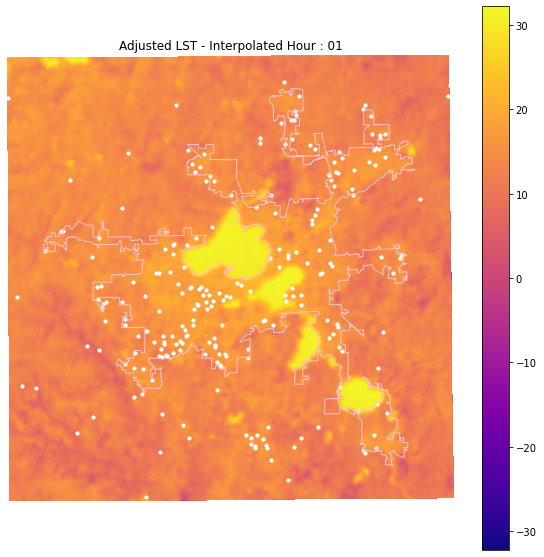

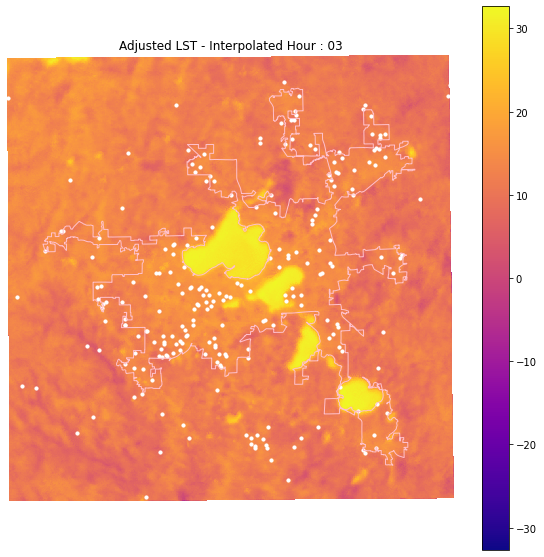

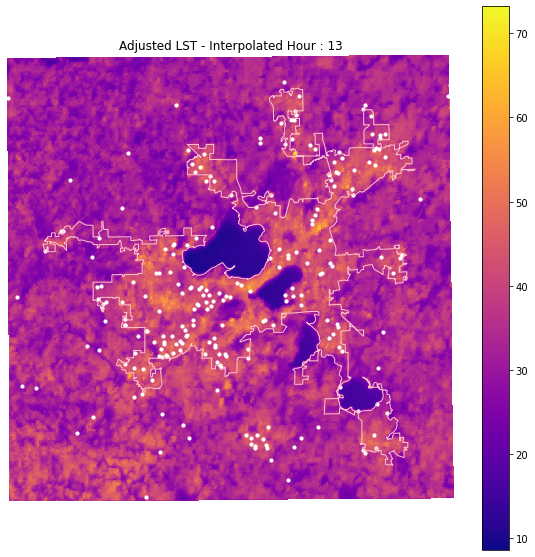

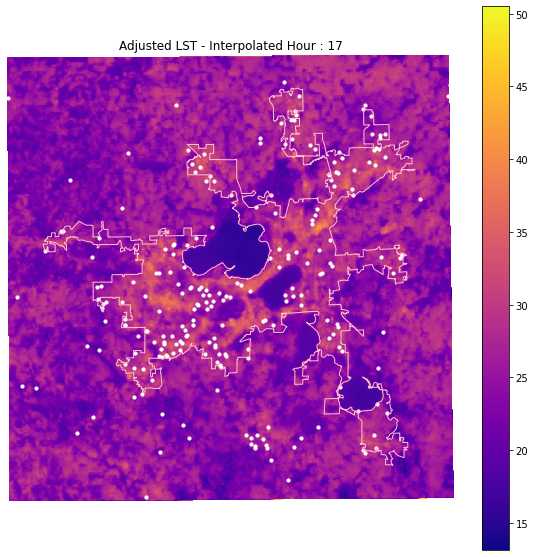

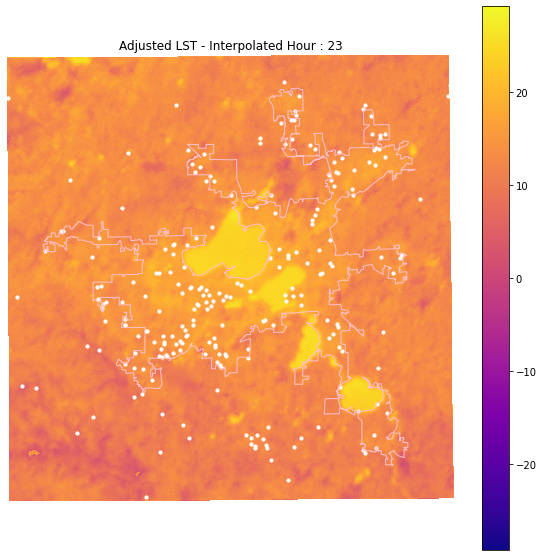

...

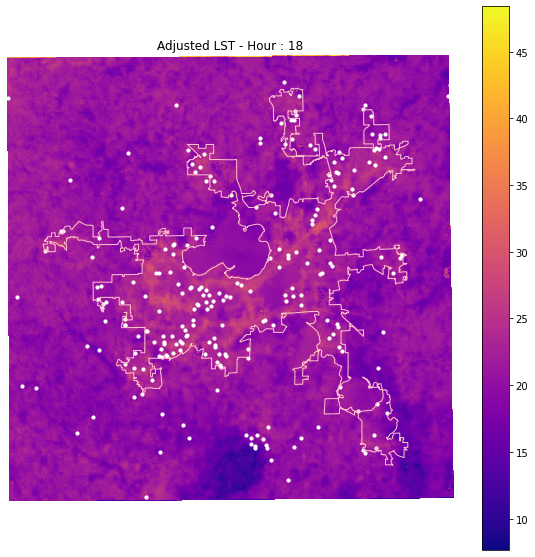

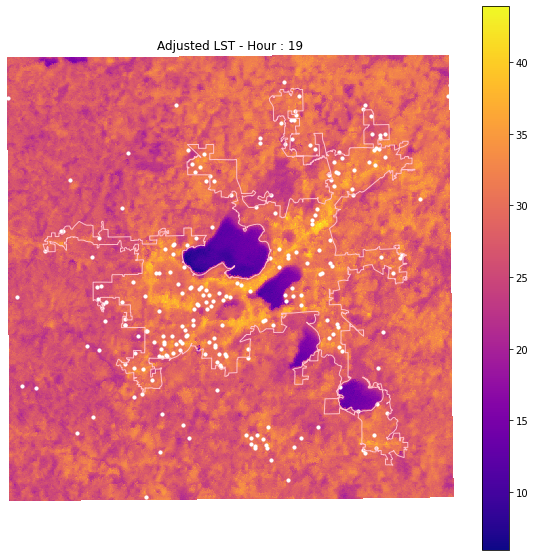

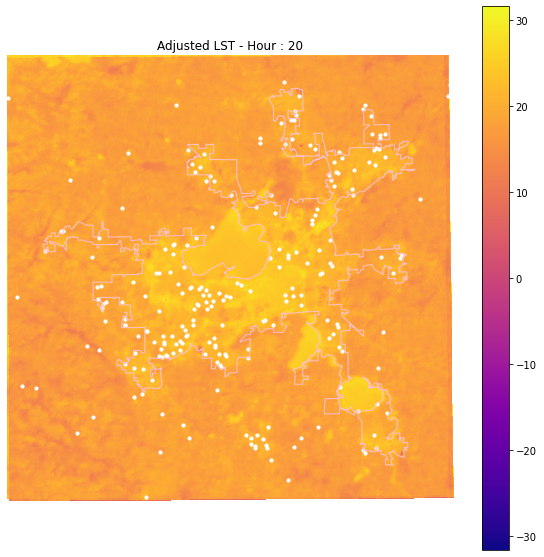

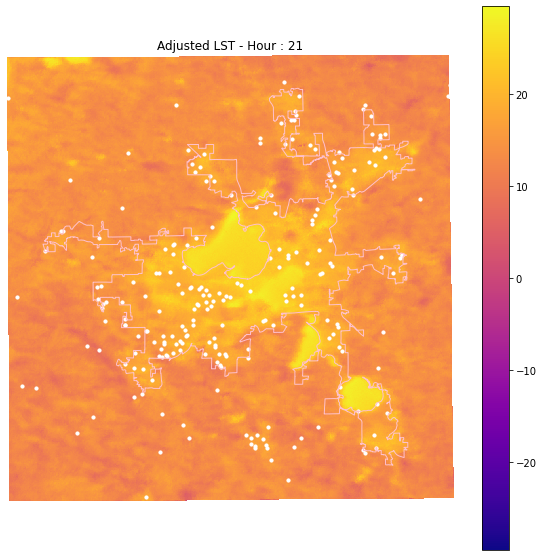

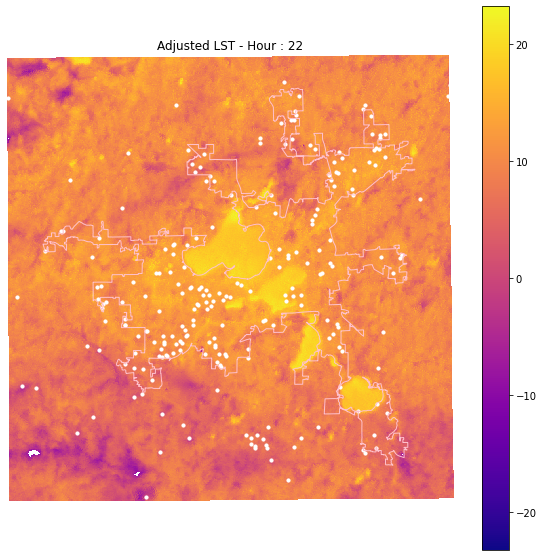

In [20]:
## Creating plots for adjusted LST

files = sorted([x for x in os.listdir(adjusted_lst_directory) if '.tif' in x])
data = {}
for file in files:    
    temp_ = rxr.open_rasterio(os.path.join(adjusted_lst_directory,file))

    hour = file.split('.')[0][-2:]
    if 'interpolated' in file:
        title = f'Adjusted LST - Interpolated Hour : {hour}'
    else:
        title = f'Adjusted LST - Hour : {hour}'
    
    fname = f'Hour_{hour}'
    data[hour]=np.nanmean(temp_.values)
    plt.figure(figsize=(10,10))
    temp_.plot(cmap='plasma')
    boundary_gdf.to_crs(temp_.rio.crs).boundary.plot(ax=plt.gca(), edgecolor='pink', linewidth=1)
    
#     # #comes from previous cell
    scatter_gdf_convert.plot(ax=plt.gca(), color='white', markersize=10)
    plt.axis('off')  # Hide axis
    
    save_loc = f'/Users/gaurav/UAH/temperature_modelling/Resources/temperature_plots/{default_location}_{default_year}_adjusted_lst/{fname}.png'    
    plt.title(title)
    os.makedirs(f'/Users/gaurav/UAH/temperature_modelling/Resources/temperature_plots/{default_location}_{default_year}_adjusted_lst/',exist_ok=True)
    plt.savefig(save_loc, bbox_inches='tight', pad_inches=0, dpi=300)

print(f'Plots to be saved in {save_loc}')

In [20]:
## segment to create a lst gif if required
gif_directory = f'/Users/gaurav/UAH/temperature_modelling/Resources/temperature_plots/{default_location}_{default_year}_adjusted_lst/'
helper.to_gif(gif_directory,default_location,default_year,image_fps=1.5)
